This is a YOLO model training to detect Guppy fish objects. The model used is the yolov8s model with a total of 200 training epochs. This model is trained to detect Guppy fish objects for my thesis in the form of predicting oxygen levels in aquascape water through fish positions, but it is possible that the results of this model training can also be used for other things.

The code arrangement pattern that I use for this training, I take references from the code on the following Kaggle link:

https://www.kaggle.com/code/pkdarabi/traffic-signs-detection-using-yolov8

made by Parisa Karimi Darabi, then I modified it to suit this case.

**1.Check the files in the dataset folder**

This is a code cell to check the files in the dataset, but this code cell can be left unused if you want to train the YOLO model on local computing, while for non-Kaggle cloud computing you only need to change the contents of "os.walk".

In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('../Sample_data'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

../Sample_data\robot_fish.mp4
../Sample_data\base_data\images\robot_fish_1.png
../Sample_data\base_data\images\robot_fish_10.png
../Sample_data\base_data\images\robot_fish_100.png
../Sample_data\base_data\images\robot_fish_101.png
../Sample_data\base_data\images\robot_fish_102.png
../Sample_data\base_data\images\robot_fish_103.png
../Sample_data\base_data\images\robot_fish_104.png
../Sample_data\base_data\images\robot_fish_105.png
../Sample_data\base_data\images\robot_fish_106.png
../Sample_data\base_data\images\robot_fish_107.png
../Sample_data\base_data\images\robot_fish_108.png
../Sample_data\base_data\images\robot_fish_109.png
../Sample_data\base_data\images\robot_fish_11.png
../Sample_data\base_data\images\robot_fish_110.png
../Sample_data\base_data\images\robot_fish_111.png
../Sample_data\base_data\images\robot_fish_112.png
../Sample_data\base_data\images\robot_fish_113.png
../Sample_data\base_data\images\robot_fish_114.png
../Sample_data\base_data\images\robot_fish_115.png
../Sa

**2.Import Library**

code cell to import the required libraries

In [2]:
# !pip install ultralytics
# Import Essential Libraries
import os
import random
import pandas as pd
from PIL import Image
import cv2
from ultralytics import YOLO
from IPython.display import Video
import numpy as np  
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style='darkgrid')
import pathlib
import glob
from tqdm.notebook import trange, tqdm
import warnings
warnings.filterwarnings('ignore')

RuntimeError: module compiled against ABI version 0x1000009 but this version of numpy is 0x2000000

ImportError: numpy.core.multiarray failed to import

**3. Configure the plot display that the Seaborn library will create**

In [19]:
# Configure the visual appearance of Seaborn plots
sns.set(rc={'axes.facecolor': '#eae8fa'}, style='darkgrid')

**4. Displays 9 random images in the train folder**

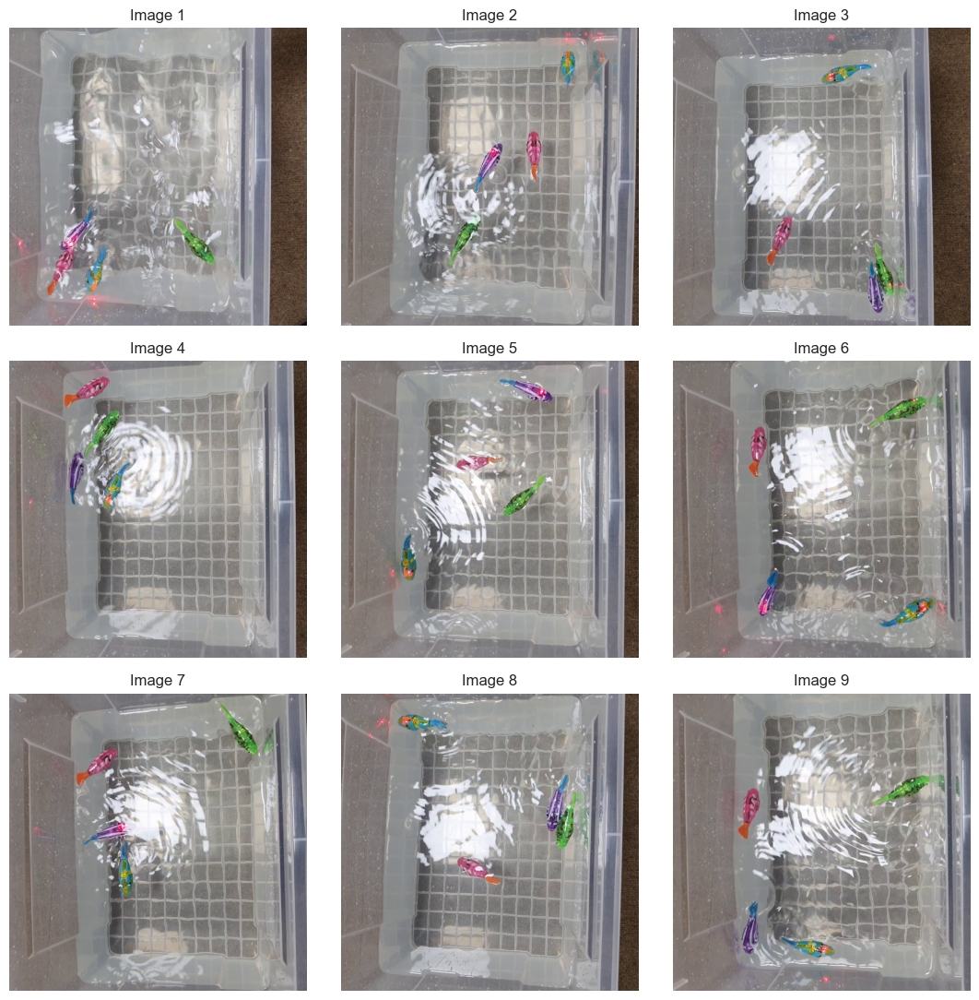

In [20]:
Image_dir = '../Sample_data/train/images'

num_samples = 9
image_files = os.listdir(Image_dir)

# Randomly select num_samples images
rand_images = random.sample(image_files, num_samples)

fig, axes = plt.subplots(3, 3, figsize=(11, 11))

for i in range(num_samples):
    image = rand_images[i]
    ax = axes[i // 3, i % 3]
    ax.imshow(plt.imread(os.path.join(Image_dir, image)))
    ax.set_title(f'Image {i+1}')
    ax.axis('off')

plt.tight_layout()
plt.show()

**5. Get resolution and channel information on one of the images in the train folder**

In [21]:
# Get the size of the image
image = cv2.imread("../Sample_data/train/images/robot_fish_1.png")
h, w, c = image.shape
print(f"The image has dimensions {w}x{h} and {c} channels.")

The image has dimensions 1440x1440 and 3 channels.


**6. Object detection from selected images using yolov8s default**

Object detection using YOLO version of COCO dataset

In [22]:
# Use a pretrained YOLOv8n model
model = YOLO("yolov8s.pt") 

# Use the model to detect object
image = "../Sample_data/train/images/robot_fish_1.png"
result_predict = model.predict(source = image, imgsz=(640))

# show results
plot = result_predict[0].plot()
plot = cv2.cvtColor(plot, cv2.COLOR_BGR2RGB)
display(Image.fromarray(plot))

NotImplementedError: Could not run 'torchvision::nms' with arguments from the 'CUDA' backend. This could be because the operator doesn't exist for this backend, or was omitted during the selective/custom build process (if using custom build). If you are a Facebook employee using PyTorch on mobile, please visit https://fburl.com/ptmfixes for possible resolutions. 'torchvision::nms' is only available for these backends: [CPU, Meta, QuantizedCPU, BackendSelect, Python, FuncTorchDynamicLayerBackMode, Functionalize, Named, Conjugate, Negative, ZeroTensor, ADInplaceOrView, AutogradOther, AutogradCPU, AutogradCUDA, AutogradXLA, AutogradMPS, AutogradXPU, AutogradHPU, AutogradLazy, AutogradMTIA, AutogradMeta, Tracer, AutocastCPU, AutocastMTIA, AutocastXPU, AutocastMPS, AutocastCUDA, FuncTorchBatched, BatchedNestedTensor, FuncTorchVmapMode, Batched, VmapMode, FuncTorchGradWrapper, PythonTLSSnapshot, FuncTorchDynamicLayerFrontMode, PreDispatch, PythonDispatcher].

CPU: registered at C:\actions-runner\_work\vision\vision\pytorch\vision\torchvision\csrc\ops\cpu\nms_kernel.cpp:112 [kernel]
Meta: registered at /dev/null:214 [kernel]
QuantizedCPU: registered at C:\actions-runner\_work\vision\vision\pytorch\vision\torchvision\csrc\ops\quantized\cpu\qnms_kernel.cpp:124 [kernel]
BackendSelect: fallthrough registered at C:\actions-runner\_work\pytorch\pytorch\pytorch\aten\src\ATen\core\BackendSelectFallbackKernel.cpp:3 [backend fallback]
Python: registered at C:\actions-runner\_work\pytorch\pytorch\pytorch\aten\src\ATen\core\PythonFallbackKernel.cpp:194 [backend fallback]
FuncTorchDynamicLayerBackMode: registered at C:\actions-runner\_work\pytorch\pytorch\pytorch\aten\src\ATen\functorch\DynamicLayer.cpp:479 [backend fallback]
Functionalize: registered at C:\actions-runner\_work\pytorch\pytorch\pytorch\aten\src\ATen\FunctionalizeFallbackKernel.cpp:349 [backend fallback]
Named: registered at C:\actions-runner\_work\pytorch\pytorch\pytorch\aten\src\ATen\core\NamedRegistrations.cpp:7 [backend fallback]
Conjugate: registered at C:\actions-runner\_work\pytorch\pytorch\pytorch\aten\src\ATen\ConjugateFallback.cpp:17 [backend fallback]
Negative: registered at C:\actions-runner\_work\pytorch\pytorch\pytorch\aten\src\ATen\native\NegateFallback.cpp:18 [backend fallback]
ZeroTensor: registered at C:\actions-runner\_work\pytorch\pytorch\pytorch\aten\src\ATen\ZeroTensorFallback.cpp:86 [backend fallback]
ADInplaceOrView: fallthrough registered at C:\actions-runner\_work\pytorch\pytorch\pytorch\aten\src\ATen\core\VariableFallbackKernel.cpp:100 [backend fallback]
AutogradOther: registered at C:\actions-runner\_work\pytorch\pytorch\pytorch\aten\src\ATen\core\VariableFallbackKernel.cpp:63 [backend fallback]
AutogradCPU: registered at C:\actions-runner\_work\pytorch\pytorch\pytorch\aten\src\ATen\core\VariableFallbackKernel.cpp:67 [backend fallback]
AutogradCUDA: registered at C:\actions-runner\_work\pytorch\pytorch\pytorch\aten\src\ATen\core\VariableFallbackKernel.cpp:75 [backend fallback]
AutogradXLA: registered at C:\actions-runner\_work\pytorch\pytorch\pytorch\aten\src\ATen\core\VariableFallbackKernel.cpp:83 [backend fallback]
AutogradMPS: registered at C:\actions-runner\_work\pytorch\pytorch\pytorch\aten\src\ATen\core\VariableFallbackKernel.cpp:91 [backend fallback]
AutogradXPU: registered at C:\actions-runner\_work\pytorch\pytorch\pytorch\aten\src\ATen\core\VariableFallbackKernel.cpp:71 [backend fallback]
AutogradHPU: registered at C:\actions-runner\_work\pytorch\pytorch\pytorch\aten\src\ATen\core\VariableFallbackKernel.cpp:104 [backend fallback]
AutogradLazy: registered at C:\actions-runner\_work\pytorch\pytorch\pytorch\aten\src\ATen\core\VariableFallbackKernel.cpp:87 [backend fallback]
AutogradMTIA: registered at C:\actions-runner\_work\pytorch\pytorch\pytorch\aten\src\ATen\core\VariableFallbackKernel.cpp:79 [backend fallback]
AutogradMeta: registered at C:\actions-runner\_work\pytorch\pytorch\pytorch\aten\src\ATen\core\VariableFallbackKernel.cpp:95 [backend fallback]
Tracer: registered at C:\actions-runner\_work\pytorch\pytorch\pytorch\torch\csrc\autograd\TraceTypeManual.cpp:294 [backend fallback]
AutocastCPU: registered at C:\actions-runner\_work\vision\vision\pytorch\vision\torchvision\csrc\ops\autocast\nms_kernel.cpp:34 [kernel]
AutocastMTIA: fallthrough registered at C:\actions-runner\_work\pytorch\pytorch\pytorch\aten\src\ATen\autocast_mode.cpp:466 [backend fallback]
AutocastXPU: registered at C:\actions-runner\_work\vision\vision\pytorch\vision\torchvision\csrc\ops\autocast\nms_kernel.cpp:41 [kernel]
AutocastMPS: fallthrough registered at C:\actions-runner\_work\pytorch\pytorch\pytorch\aten\src\ATen\autocast_mode.cpp:209 [backend fallback]
AutocastCUDA: registered at C:\actions-runner\_work\vision\vision\pytorch\vision\torchvision\csrc\ops\autocast\nms_kernel.cpp:27 [kernel]
FuncTorchBatched: registered at C:\actions-runner\_work\pytorch\pytorch\pytorch\aten\src\ATen\functorch\LegacyBatchingRegistrations.cpp:731 [backend fallback]
BatchedNestedTensor: registered at C:\actions-runner\_work\pytorch\pytorch\pytorch\aten\src\ATen\functorch\LegacyBatchingRegistrations.cpp:758 [backend fallback]
FuncTorchVmapMode: fallthrough registered at C:\actions-runner\_work\pytorch\pytorch\pytorch\aten\src\ATen\functorch\VmapModeRegistrations.cpp:27 [backend fallback]
Batched: registered at C:\actions-runner\_work\pytorch\pytorch\pytorch\aten\src\ATen\LegacyBatchingRegistrations.cpp:1075 [backend fallback]
VmapMode: fallthrough registered at C:\actions-runner\_work\pytorch\pytorch\pytorch\aten\src\ATen\VmapModeRegistrations.cpp:33 [backend fallback]
FuncTorchGradWrapper: registered at C:\actions-runner\_work\pytorch\pytorch\pytorch\aten\src\ATen\functorch\TensorWrapper.cpp:208 [backend fallback]
PythonTLSSnapshot: registered at C:\actions-runner\_work\pytorch\pytorch\pytorch\aten\src\ATen\core\PythonFallbackKernel.cpp:202 [backend fallback]
FuncTorchDynamicLayerFrontMode: registered at C:\actions-runner\_work\pytorch\pytorch\pytorch\aten\src\ATen\functorch\DynamicLayer.cpp:475 [backend fallback]
PreDispatch: registered at C:\actions-runner\_work\pytorch\pytorch\pytorch\aten\src\ATen\core\PythonFallbackKernel.cpp:206 [backend fallback]
PythonDispatcher: registered at C:\actions-runner\_work\pytorch\pytorch\pytorch\aten\src\ATen\core\PythonFallbackKernel.cpp:198 [backend fallback]


**7. Cell code for YOLO training using guppy-fish-dataset-yolo dataset**

The configuration of training and data augmentation used can be changed according to your wishes.

In [46]:
# Build from YAML and transfer weights
Final_model = YOLO('yolov8s.pt')

# Training The Final Model
Result_Final_model = Final_model.train(
    data="Sample_data.yaml", 
    epochs = 200, 
    imgsz = 640,
    lr0 = 0.005,
    momentum = 0.9,
    weight_decay = 0.005,
    warmup_epochs = 5,
    warmup_momentum = 0.8,
    warmup_bias_lr = 0.01,
    batch = 32,
    device = 0,

    mosaic = 1.0,
    mixup = 0.0,
    fliplr = 0.5,
    flipud = 0.3,
    degrees = 15.0,
    translate = 0.1,
    scale = 0.3,
    shear = 2.0,
    hsv_h = 0.015,
    hsv_s = 0.7,
    hsv_v = 0.4,

    cache = True,
    verbose = False,
    rect = False,
    cos_lr = True,
    profile = True
    )


New https://pypi.org/project/ultralytics/8.3.161 available  Update with 'pip install -U ultralytics'
Ultralytics 8.3.156  Python-3.10.11 torch-2.7.0+cpu 


ValueError: Invalid CUDA 'device=0' requested. Use 'device=cpu' or pass valid CUDA device(s) if available, i.e. 'device=0' or 'device=0,1,2,3' for Multi-GPU.

torch.cuda.is_available(): False
torch.cuda.device_count(): 0
os.environ['CUDA_VISIBLE_DEVICES']: 0
See https://pytorch.org/get-started/locally/ for up-to-date torch install instructions if no CUDA devices are seen by torch.


**8. Displays training results.**

The training results in question are in the form of confusion matrix, F1-score graph, Precision, Recall, and others that are needed for analysis.

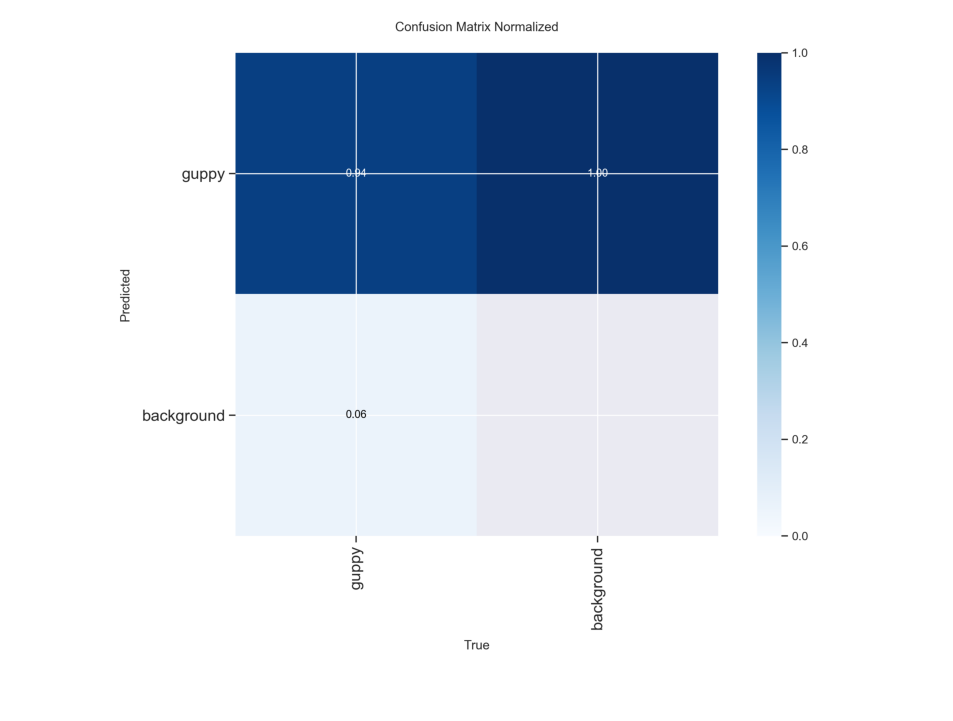

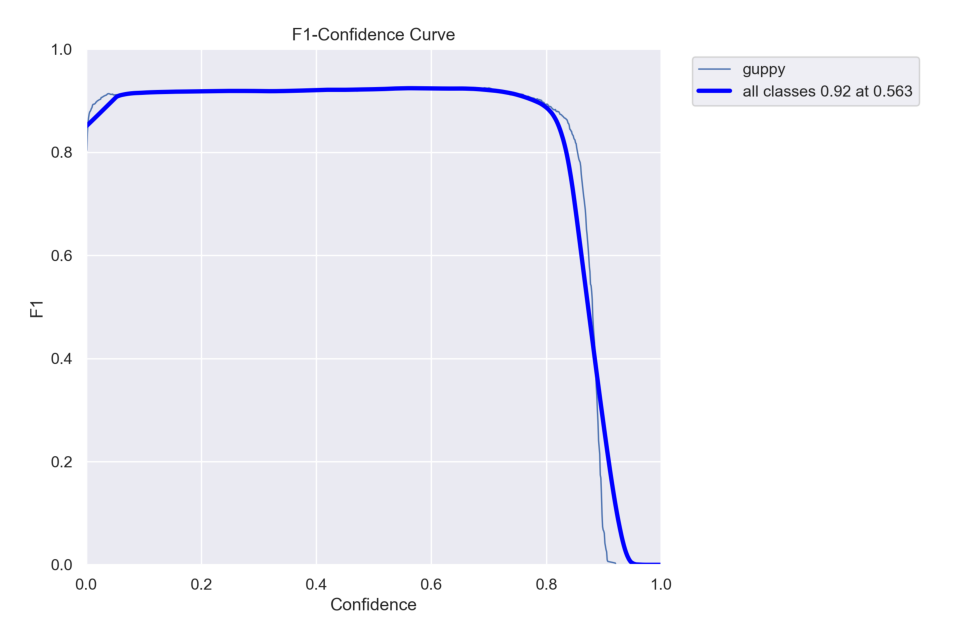

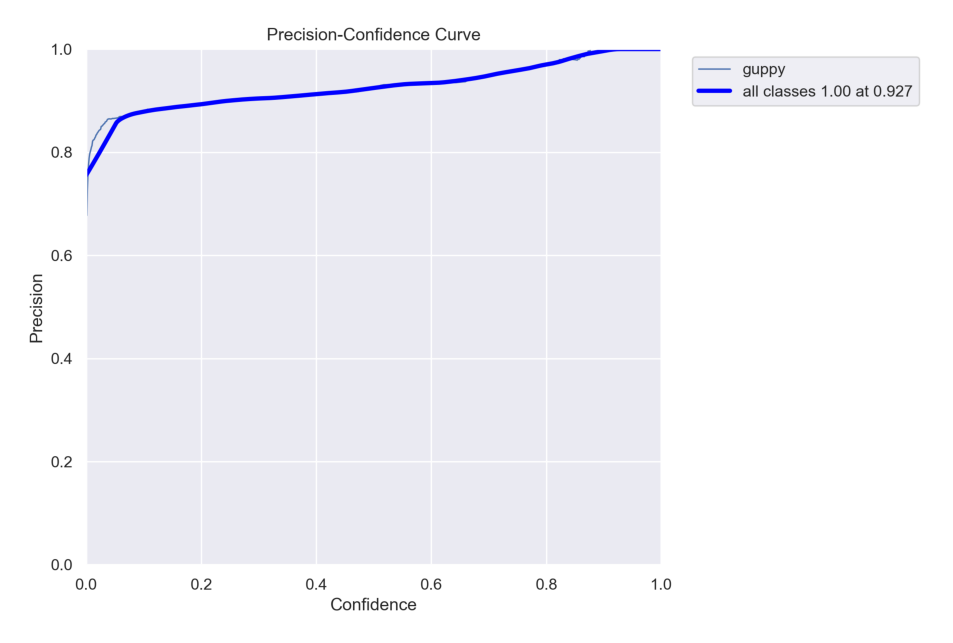

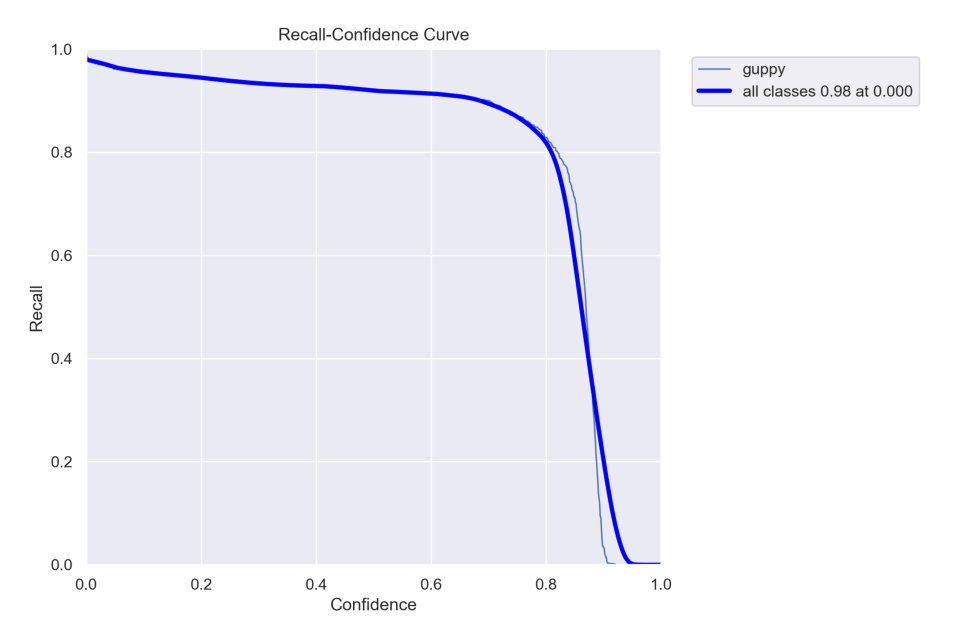

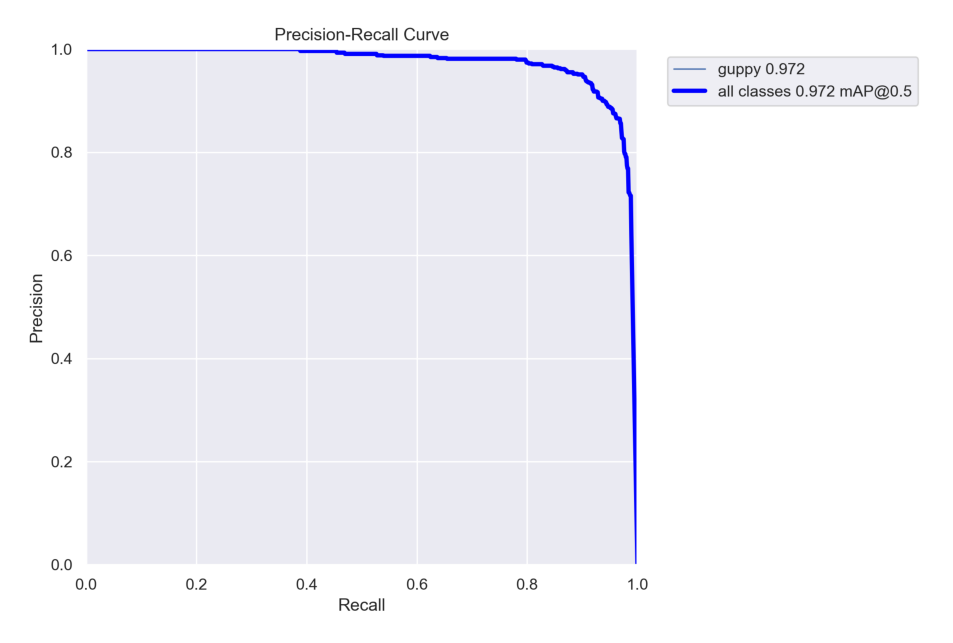

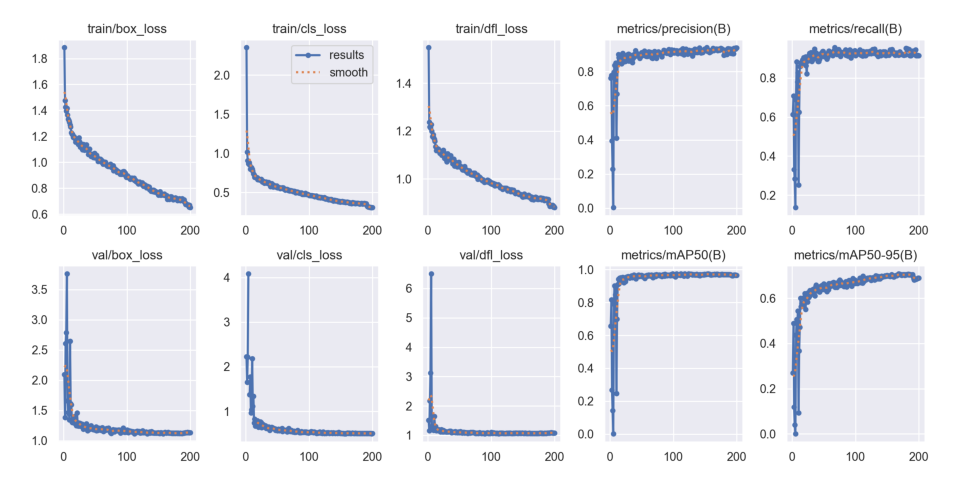

In [20]:
import os
import cv2
import matplotlib.pyplot as plt

def display_images(post_training_files_path, image_files):

    for image_file in image_files:
        image_path = os.path.join(post_training_files_path, image_file)
        img = cv2.imread(image_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        
        plt.figure(figsize=(10, 10), dpi=120)
        plt.imshow(img)
        plt.axis('off')
        plt.show()

# List of image files to display
image_files = [
    'confusion_matrix_normalized.png',
    'F1_curve.png',
    'P_curve.png',
    'R_curve.png',
    'PR_curve.png',
    'results.png'
]

# Path to the directory containing the images
post_training_files_path = '../runs/detect/train'

# Display the images
display_images(post_training_files_path, image_files)


**9. Display training results in csv format**

In [21]:
Result_Final_model = pd.read_csv('../runs/detect/train/results.csv')
Result_Final_model.tail(10)

,epoch,time,train/box_loss,train/cls_loss,train/dfl_loss,metrics/precision(B),metrics/recall(B),metrics/mAP50(B),metrics/mAP50-95(B),val/box_loss,val/cls_loss,val/dfl_loss,lr/pg0,lr/pg1,lr/pg2
190,191,1962.93,0.69444,0.33561,0.89624,0.90782,0.93844,0.96715,0.69636,1.12852,0.50391,1.07892,0.000032,0.000032,0.000032
191,192,1973.23,0.68893,0.32179,0.89191,0.90621,0.93677,0.96466,0.68690,1.13232,0.50597,1.08298,0.000030,0.000030,0.000030
192,193,1983.30,0.67603,0.31970,0.88471,0.90629,0.93178,0.96231,0.68158,1.13513,0.50640,1.08467,0.000028,0.000028,0.000028
193,194,1993.43,0.67859,0.31548,0.88889,0.90395,0.93951,0.96376,0.68208,1.13641,0.50906,1.08557,0.000026,0.000026,0.000026
194,195,2003.56,0.67179,0.31324,0.88611,0.90419,0.94343,0.96564,0.68407,1.13630,0.50680,1.08583,0.000024,0.000024,0.000024
195,196,2013.63,0.67013,0.31123,0.88797,0.93692,0.91440,0.96686,0.68434,1.13722,0.50558,1.08606,0.000023,0.000023,0.000023
196,197,2023.66,0.67236,0.30732,0.89093,0.93398,0.91514,0.96715,0.68697,1.13483,0.50610,1.08437,0.000022,0.000022,0.000022
197,198,2033.60,0.65586,0.30603,0.88254,0.93235,0.91731,0.96745,0.68770,1.13381,0.50575,1.08291,0.000021,0.000021,0.000021
198,199,2043.51,0.66939,0.30992,0.88475,0.93854,0.91479,0.96484,0.68914,1.13262,0.50228,1.08165,0.000020,0.000020,0.000020
199,200,2053.61,0.65072,0.30814,0.87969,0.93940,0.91514,0.96529,0.68903,1.13404,0.50337,1.08185,0.000020,0.000020,0.000020


**10. Creating a graph from data in a csv file**

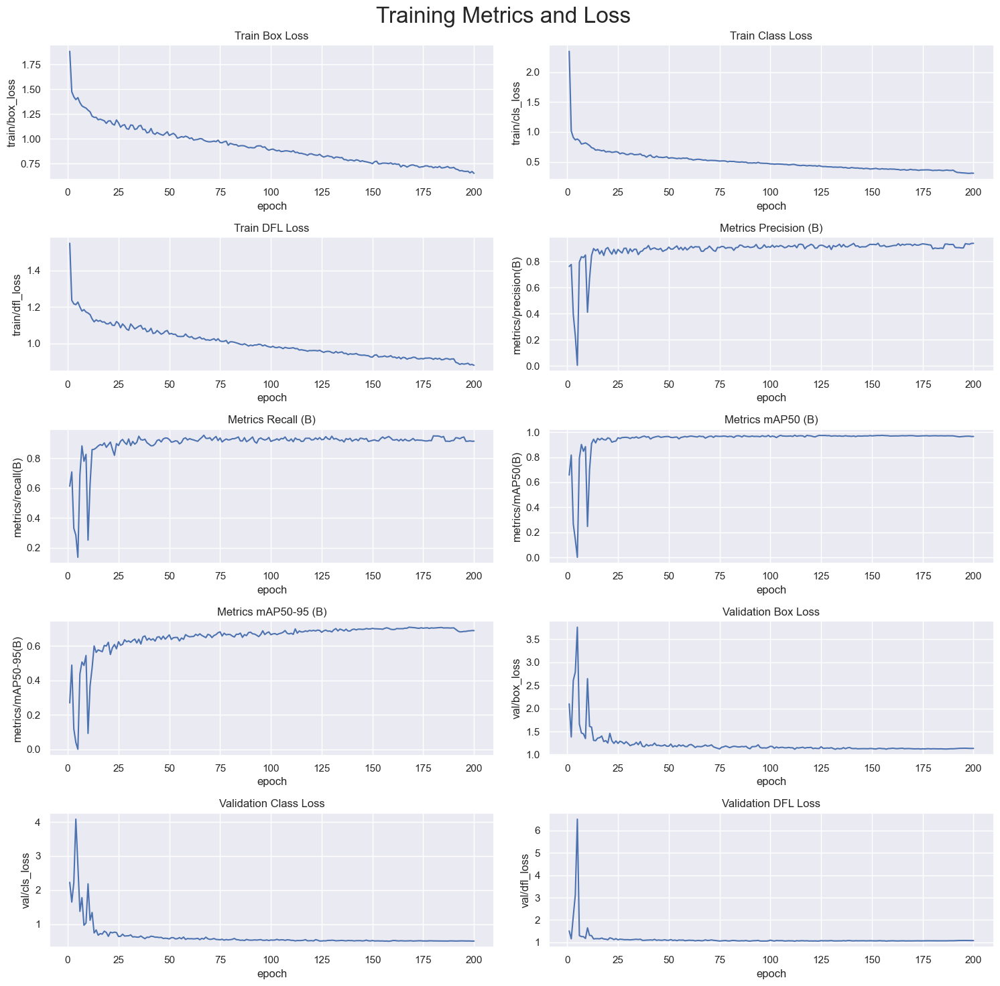

In [22]:
# Read the results.csv file as a pandas dataframe
Result_Final_model.columns = Result_Final_model.columns.str.strip()

# Create subplots
fig, axs = plt.subplots(nrows=5, ncols=2, figsize=(15, 15))

# Plot the columns using seaborn
sns.lineplot(x='epoch', y='train/box_loss', data=Result_Final_model, ax=axs[0,0])
sns.lineplot(x='epoch', y='train/cls_loss', data=Result_Final_model, ax=axs[0,1])
sns.lineplot(x='epoch', y='train/dfl_loss', data=Result_Final_model, ax=axs[1,0])
sns.lineplot(x='epoch', y='metrics/precision(B)', data=Result_Final_model, ax=axs[1,1])
sns.lineplot(x='epoch', y='metrics/recall(B)', data=Result_Final_model, ax=axs[2,0])
sns.lineplot(x='epoch', y='metrics/mAP50(B)', data=Result_Final_model, ax=axs[2,1])
sns.lineplot(x='epoch', y='metrics/mAP50-95(B)', data=Result_Final_model, ax=axs[3,0])
sns.lineplot(x='epoch', y='val/box_loss', data=Result_Final_model, ax=axs[3,1])
sns.lineplot(x='epoch', y='val/cls_loss', data=Result_Final_model, ax=axs[4,0])
sns.lineplot(x='epoch', y='val/dfl_loss', data=Result_Final_model, ax=axs[4,1])

# Set titles and axis labels for each subplot
axs[0,0].set(title='Train Box Loss')
axs[0,1].set(title='Train Class Loss')
axs[1,0].set(title='Train DFL Loss')
axs[1,1].set(title='Metrics Precision (B)')
axs[2,0].set(title='Metrics Recall (B)')
axs[2,1].set(title='Metrics mAP50 (B)')
axs[3,0].set(title='Metrics mAP50-95 (B)')
axs[3,1].set(title='Validation Box Loss')
axs[4,0].set(title='Validation Class Loss')
axs[4,1].set(title='Validation DFL Loss')


plt.suptitle('Training Metrics and Loss', fontsize=24)
plt.subplots_adjust(top=0.8)
plt.tight_layout()
plt.show()

**11. Performing model performance validation**

In [23]:
# Loading the best performing model
Valid_model = YOLO('../runs/detect/train/weights/best.pt')

# Evaluating the model on the validset
metrics = Valid_model.val(split = 'val')

# final results 
print("precision(B): ", metrics.results_dict["metrics/precision(B)"])
print("metrics/recall(B): ", metrics.results_dict["metrics/recall(B)"])
print("metrics/mAP50(B): ", metrics.results_dict["metrics/mAP50(B)"])
print("metrics/mAP50-95(B): ", metrics.results_dict["metrics/mAP50-95(B)"])

Ultralytics 8.3.156  Python-3.10.11 torch-2.5.1+cu118 CUDA:0 (NVIDIA GeForce RTX 3060, 12288MiB)
Model summary (fused): 72 layers, 11,125,971 parameters, 0 gradients, 28.4 GFLOPs
val: Fast image access  (ping: 0.10.0 ms, read: 740.982.0 MB/s, size: 493.2 KB)


val: Scanning C:\Source\YOLO_Practice\YOLO_V8\Guppy_fish_dataset_YOLO\valid\labels.cache... 150 images, 0 backgrounds, 0 corrupt: 100%|██████████| 150/150 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:01<00:00,  5.04it/s]


                   all        150        601      0.932      0.917      0.972      0.707
Speed: 0.5ms preprocess, 4.9ms inference, 0.0ms loss, 1.9ms postprocess per image
Results saved to c:\Source\YOLO_Practice\runs\detect\val
precision(B):  0.9318989107544849
metrics/recall(B):  0.9168053244592346
metrics/mAP50(B):  0.9721559175351526
metrics/mAP50-95(B):  0.707282411090075


**12. Detecting guppy fish in 9 random images on the dataset using the trained YOLO model.**


0: 640x640 2 guppys, 154.1ms
Speed: 3.8ms preprocess, 154.1ms inference, 4.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 4 guppys, 107.8ms
Speed: 3.4ms preprocess, 107.8ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 guppy, 7.7ms
Speed: 1.5ms preprocess, 7.7ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 guppys, 7.8ms
Speed: 1.5ms preprocess, 7.8ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 2 guppys, 7.5ms
Speed: 1.8ms preprocess, 7.5ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 7 guppys, 9.6ms
Speed: 1.6ms preprocess, 9.6ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 guppy, 7.8ms
Speed: 2.0ms preprocess, 7.8ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 6 guppys, 7.8ms
Speed: 1.6ms preprocess, 7.8ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0

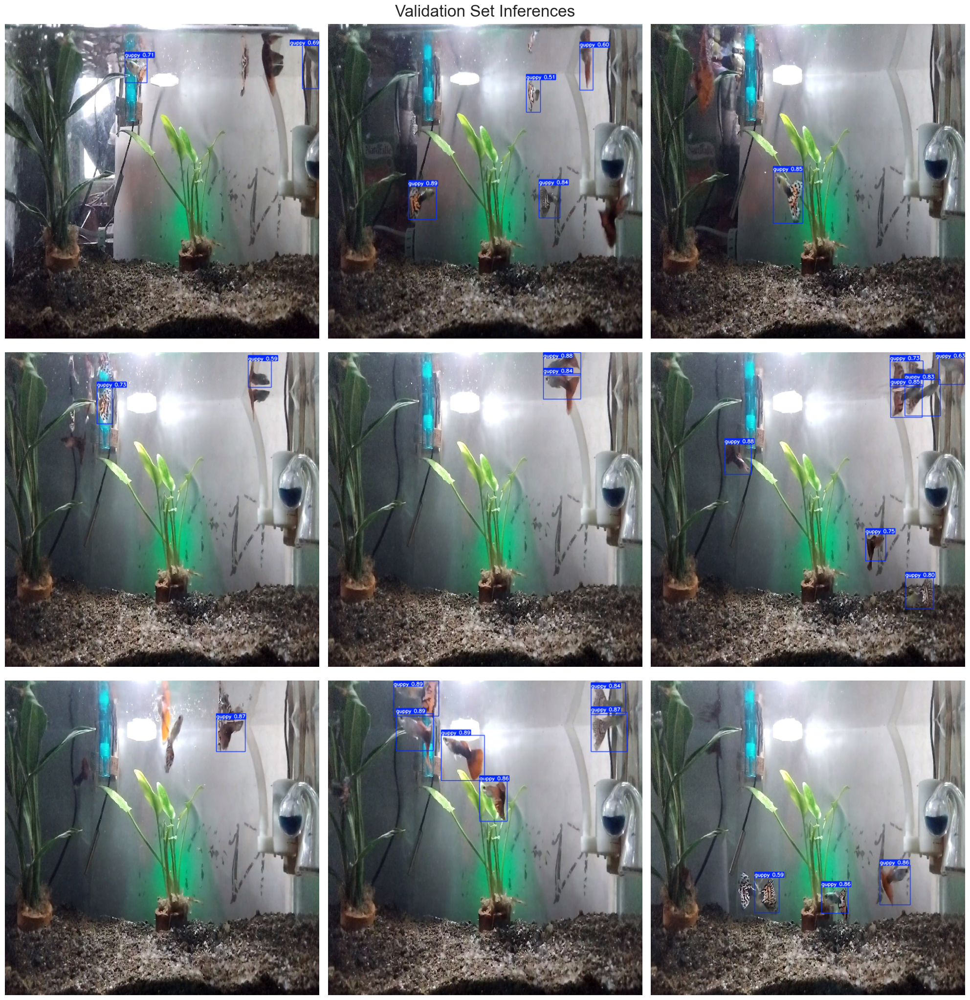

In [26]:
# Normalization function
def normalize_image(image):
    return image / 255.0

# Image resizing function
def resize_image(image, size=(640, 640)):
    return cv2.resize(image, size)

# Path to validation images
dataset_path = 'Guppy_fish_dataset_YOLO'  # Place your dataset path here
valid_images_path = os.path.join(dataset_path, 'test', 'images')

# List of all jpg images in the directory
image_files = [file for file in os.listdir(valid_images_path) if file.endswith('.jpg')]

# Check if there are images in the directory
if len(image_files) > 0:
    # Select 9 images at equal intervals
    num_images = len(image_files)
    step_size = max(1, num_images // 9)  # Ensure the interval is at least 1
    selected_images = [image_files[i] for i in range(0, num_images, step_size)]

    # Prepare subplots
    fig, axes = plt.subplots(3, 3, figsize=(20, 21))
    fig.suptitle('Validation Set Inferences', fontsize=24)

    for i, ax in enumerate(axes.flatten()):
        if i < len(selected_images):
            image_path = os.path.join(valid_images_path, selected_images[i])
            
            # Load image
            image = cv2.imread(image_path)
            
            # Check if the image is loaded correctly
            if image is not None:
                # Resize image
                resized_image = resize_image(image, size=(640, 640))
                # Normalize image
                normalized_image = normalize_image(resized_image)
                
                # Convert the normalized image to uint8 data type
                normalized_image_uint8 = (normalized_image * 255).astype(np.uint8)
                
                # Predict with the model
                results = Valid_model.predict(source=normalized_image_uint8, imgsz=640, conf=0.5)
                
                # Plot image with labels
                annotated_image = results[0].plot(line_width=1)
                annotated_image_rgb = cv2.cvtColor(annotated_image, cv2.COLOR_BGR2RGB)
                ax.imshow(annotated_image_rgb)
            else:
                print(f"Failed to load image {image_path}")
        ax.axis('off')

    plt.tight_layout()
    plt.show()


In [3]:
# 영상 및 모델 경로
video_path = '../YOLO_V8/video_aquascape_2.mp4'
model = YOLO('../runs/detect/train/weights/best.pt')

# 비디오 캡처 열기
cap = cv2.VideoCapture(video_path)
fps = cap.get(cv2.CAP_PROP_FPS)

# 🔧 첫 프레임을 읽어 회전하고, 정확한 크기 측정
ret, frame = cap.read()
if not ret:
    raise RuntimeError("영상을 읽을 수 없습니다.")

# 프레임 회전 (반시계 90도)
frame = cv2.rotate(frame, cv2.ROTATE_90_COUNTERCLOCKWISE)
height, width = frame.shape[:2]

# VideoWriter 초기화 (회전된 프레임 크기 사용)
out = cv2.VideoWriter('output_detected.mp4',
                      cv2.VideoWriter_fourcc(*'mp4v'),
                      fps, (width, height))

# 🔁 첫 프레임 처리
results = model.predict(source=frame, conf=0.5, verbose=False)
annotated_frame = results[0].plot()
out.write(annotated_frame)
cv2.imshow("Detected", annotated_frame)
cv2.waitKey(1)

# 🔁 나머지 프레임 반복 처리
while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    frame = cv2.rotate(frame, cv2.ROTATE_90_COUNTERCLOCKWISE)
    results = model.predict(source=frame, conf=0.5, verbose=False)
    annotated_frame = results[0].plot()
    out.write(annotated_frame)

    cv2.imshow("Detected", annotated_frame)
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

cap.release()
out.release()
cv2.destroyAllWindows()


In [5]:
import cv2
import torch
import argparse
import numpy as np
if not hasattr(np, 'float'):
    np.float = float
from ultralytics import YOLO
from yolox.tracker.byte_tracker import BYTETracker

# 🔍 모델 및 영상 경로
video_path = '../YOLO_V8/video_aquascape_2.mp4'
model = YOLO('../runs/detect/train/weights/best.pt')

# 🔧 ByteTrack 설정
tracker_args = {
    'track_thresh': 0.5,
    'match_thresh': 0.8,
    'track_buffer': 30,
    'frame_rate': 30,
    'min_box_area': 100,
    'iou_thresh': 0.5,
    'mot20': False
}
tracker_args = argparse.Namespace(**tracker_args)

tracker = BYTETracker(tracker_args, frame_rate=tracker_args.frame_rate)

# 🎥 비디오 열기
cap = cv2.VideoCapture(video_path)
fps = cap.get(cv2.CAP_PROP_FPS)

# ▶ 첫 프레임 읽기 및 회전
ret, frame = cap.read()
if not ret:
    raise RuntimeError("영상을 읽을 수 없습니다.")
frame = cv2.rotate(frame, cv2.ROTATE_90_COUNTERCLOCKWISE)
height, width = frame.shape[:2]

# 📼 저장용 VideoWriter 설정
out = cv2.VideoWriter('output_tracked.mp4',
                      cv2.VideoWriter_fourcc(*'mp4v'),
                      fps, (width, height))

# ▶▶ 첫 프레임 처리
results = model.predict(source=frame, conf=0.5, verbose=False)[0]
detections = []

for det in results.boxes:
    cls_id = int(det.cls)
    if cls_id != 0:  # '물고기' 클래스만 추적
        continue
    x1, y1, x2, y2 = map(int, det.xyxy[0])
    conf = float(det.conf[0])
    detections.append([x1, y1, x2 - x1, y2 - y1, conf])

dets_tensor = torch.tensor(detections) if detections else torch.empty((0, 5))
online_targets = tracker.update(dets_tensor, frame.shape[:2], frame.shape[:2])

# 🔍 시각화 (ID 포함)
for track in online_targets:
    x, y, w, h = map(int, track.tlwh)
    tid = track.track_id
    cv2.rectangle(frame, (x, y), (x + w, y + h), (0, 255, 0), 2)
    cv2.putText(frame, f'ID: {tid}', (x, y - 10),
                cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 255, 0), 2)

out.write(frame)
cv2.imshow("Tracked", frame)
cv2.waitKey(1)

# 🔁 이후 프레임 반복
while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    frame = cv2.rotate(frame, cv2.ROTATE_90_COUNTERCLOCKWISE)
    results = model.predict(source=frame, conf=0.5, verbose=False)[0]

    detections = []
    for det in results.boxes:
        cls_id = int(det.cls)
        if cls_id != 0:
            continue
        x1, y1, x2, y2 = map(int, det.xyxy[0])
        conf = float(det.conf[0])
        detections.append([x1, y1, x2 - x1, y2 - y1, conf])

    dets_tensor = torch.tensor(detections) if detections else torch.empty((0, 5))
    online_targets = tracker.update(dets_tensor, frame.shape[:2], frame.shape[:2])

    for track in online_targets:
        x, y, w, h = map(int, track.tlwh)
        tid = track.track_id
        cv2.rectangle(frame, (x, y), (x + w, y + h), (0, 255, 0), 2)
        cv2.putText(frame, f'ID: {tid}', (x, y - 10),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 255, 0), 2)

    out.write(frame)
    cv2.imshow("Tracked", frame)
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

# 자원 정리
cap.release()
out.release()
cv2.destroyAllWindows()


In [ ]:
import cv2
import argparse
from yolox.tracker.byte_tracker import BYTETracker

# 영상 및 모델 경로
video_path = '../YOLO_V8/video_aquascape_2.mp4'
model = YOLO('../runs/detect/train/weights/best.pt')

# 비디오 캡처 열기
cap = cv2.VideoCapture(video_path)
fps = cap.get(cv2.CAP_PROP_FPS)

# 첫 프레임을 읽어 회전하고, 정확한 크기 측정
ret, frame = cap.read()
if not ret:
    raise RuntimeError("영상을 읽을 수 없습니다.")
frame = cv2.rotate(frame, cv2.ROTATE_90_COUNTERCLOCKWISE)
height, width = frame.shape[:2]

# VideoWriter 초기화
out = cv2.VideoWriter('output_detected_with_tracking.mp4',
                      cv2.VideoWriter_fourcc(*'mp4v'),
                      fps, (width, height))

# ByteTrack 초기화
tracker_args = {
    'track_thresh': 0.5,
    'match_thresh': 0.8,
    'track_buffer': 30,
    'frame_rate': 30,
    'min_box_area': 100,
    'iou_thresh': 0.5,
    'mot20': False
}
tracker_args = argparse.Namespace(**tracker_args)
tracker = BYTETracker(tracker_args, frame_rate=tracker_args.frame_rate)

# 객체 추적 결과를 저장할 리스트
tracking_results = []

# 나머지 프레임 반복 처리
while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    frame = cv2.rotate(frame, cv2.ROTATE_90_COUNTERCLOCKWISE)

    # YOLO 객체 감지
    results = model.predict(source=frame, conf=0.5, verbose=False)
    detections = results[0].boxes.data.cpu().numpy()

    # ByteTrack을 사용하여 객체 추적
    detections_for_tracker = []
    for det in detections:
        x1, y1, x2, y2, conf, cls = det
        center_x = (x1 + x2) / 2
        center_y = (y1 + y2) / 2
        width = x2 - x1
        height = y2 - y1
        detections_for_tracker.append([center_x, center_y, width, height, conf])

    # 추적된 객체
    online_tracks = tracker.update(detections_for_tracker)

    # 추적된 객체 결과를 JSON 형식으로 저장
    for track in online_tracks:
        track_id = track[4]  # 객체 ID
        x1, y1, x2, y2 = track[0], track[1], track[0] + track[2], track[1] + track[3]  # 객체의 좌표
        tracking_results.append({
            "track_id": track_id,
            "bbox": [x1, y1, x2, y2],
            "confidence": track[5]
        })
        
        # 감지된 객체에 대한 라벨링
        cv2.putText(frame, f'ID: {int(track_id)}', (int(x1), int(y1)-10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255,0,0), 2)
        cv2.rectangle(frame, (int(x1), int(y1)), (int(x2), int(y2)), (255, 0, 0), 2)

    # 결과를 비디오에 저장
    out.write(frame)

    # 추적된 객체를 화면에 표시
    cv2.imshow("Detected and Tracked", frame)
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

cap.release()
out.release()
cv2.destroyAllWindows()

# 추적된 결과를 JSON 파일로 저장
import json
with open('tracking_results.json', 'w') as f:
    json.dump(tracking_results, f, indent=4)

TypeError: BYTETracker.update() missing 2 required positional arguments: 'img_info' and 'img_size'

: 